# imports

In [1]:
import anndata as ad
import scanpy as sc
import numpy as np
import seaborn as sns
import palettable
import pandas as pd
import scipy
import scipy.io as sio
import pickle
import sys
sys.path.append('/home/yzy/bioSIMS/code/analysis')
from utils_220 import *
sc.set_figure_params(dpi=500, color_map='viridis',transparent=True,dpi_save=500)
sc.settings.verbosity = 2
%matplotlib inline


Using TensorFlow backend.
/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.cluster.bicluster module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.cluster. Anything that cannot be imported from sklearn.cluster is now part of the private API.
  warnings.warn(message, FutureWarning)


# functions

In [2]:
def get_SIMS_data(data,n_matter):



    matter_list_filename_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/matters_candidate.pkl'


#     data = 'P6_neg1_low0_None_auto'
    test_sample_temp='/home/yzy/bioSIMS/data/process/{0}/preprocess/test_samples_{1}.mat'



    matter_list_filename = matter_list_filename_temp.format(data)
    test_sample_filename = test_sample_temp.format(data,str(n_matter))
    test_sample_all = sio.loadmat(test_sample_filename)['test_samples']
    
   
    matter_list = pickle.load(open(matter_list_filename,'rb'))
    matter_list = np.array(matter_list)
    return test_sample_all,matter_list

In [3]:
def get_closest_A(matter_list,standard_mz=134.05):
    dif = matter_list-standard_mz
    dif = np.abs(dif)
    return matter_list[np.argsort(dif)[0]]

In [4]:
def show_mz(matter,test_sample,matter_list):
    sns.set_style('white')
    m_idx = np.where(matter_list==matter)
    show_img = np.reshape(test_sample[:,m_idx],(256,256))
    plt.imshow(show_img,cmap='Reds')
    plt.title(str(matter))
    plt.show()

# show 10A cell line data

In [10]:
test_sample,matter_list = get_SIMS_data('cl_10a_None',274)

In [9]:
get_closest_A(matter_list)

134.05

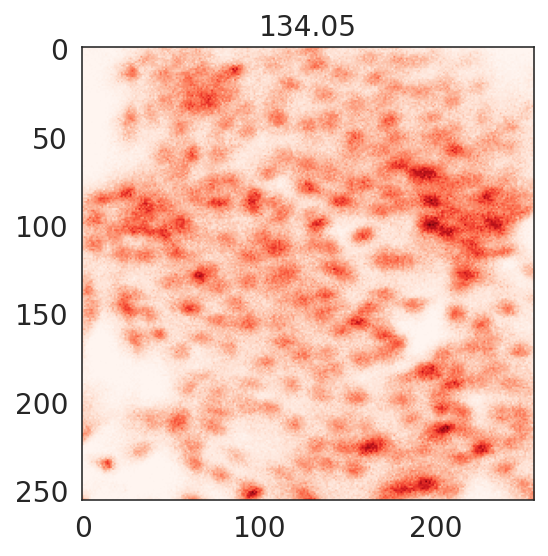

In [17]:
show_mz(134.05,test_sample,matter_list)

# SIMS data across cell line, mouse tissues, and patient samples...

In [5]:
file_list = ['cl_10a_None','cl_a549_None','cl_hela_None','cl_sk_None',
             
            'mouse0_kidney0_neg0_high0_20_None_auto','20190103_intestine2_filter_auto',
            '20190103_lung3_filter',
            
            'mouse1_liver0_neg1_high0_None_auto','mouse1_liver0_neg2_high0_None_auto',
            'mouse1_liver0_neg0_high0_None_auto','mouse0_liver0_neg1_high0_div15_None_ada',
            'mouse0_liver0_neg0_high0_None_auto','mouse0_liver0_neg2_high0_None_ada',
            
            'P6_neg1_low0_None_auto','P6_neg0_low0_None_auto',
            'P6_neg3_low0_None_auto','P6_neg2_low0_None_auto',
            'P5LC_NEG1_HIGH0_None_auto','20190115_liverfiber2_filter',
            'P3_R3_None_auto','P3_R4_None_auto',
            'P3_R5_None_auto','P3_R6_None_auto']
name_list = ['10A','A549','Hela','SK',
             
            'mouse_kidney','mouse_intestine',
             'mouse_lung',
            
            'mouse_liver_6','mouse_liver_5',
             'mouse_liver_4','mouse_liver_1',
            'mouse_liver_3','mouse_liver_2',
            
            'human_R1','human_R2',
            'human_R3','human_R4',
            'human_R5','human_R6',
            'human_R7','human_R8',
            'human_R9','human_R10',]
n_matter_list = [274,274,274,274,
                 
                221,181,
                164,
                
                254,252,
                248,244,
                224,244,
                
                228,231,
                234,228,
                220,191,
                254,254,
                254,254
                ]

In [28]:
test_sample[0].shape

(274,)

# collect top 25 correlated m/zs with adenine

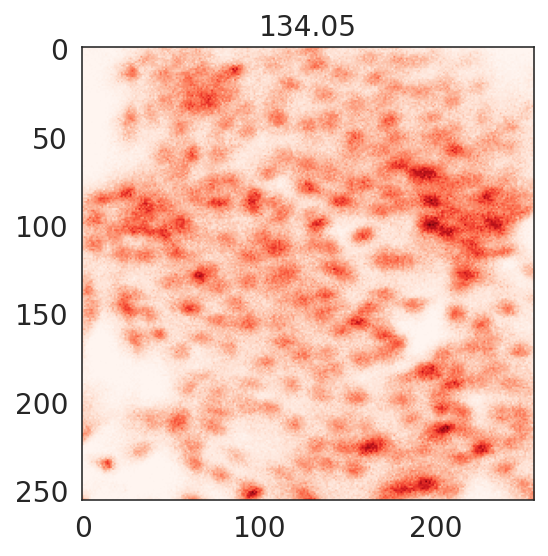

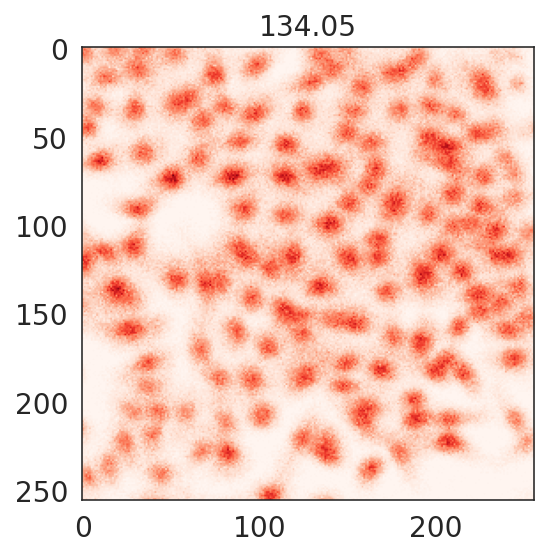

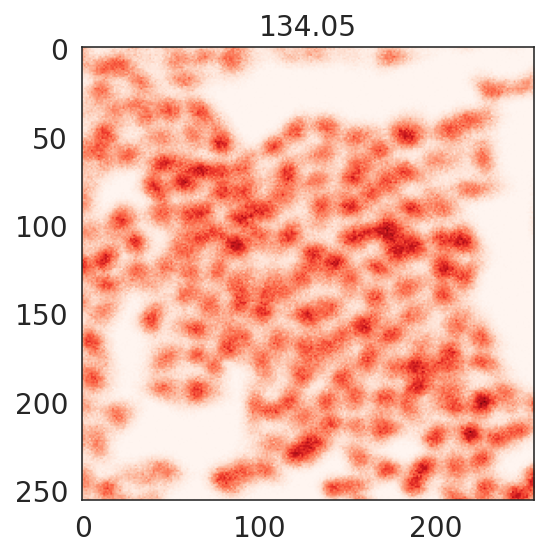

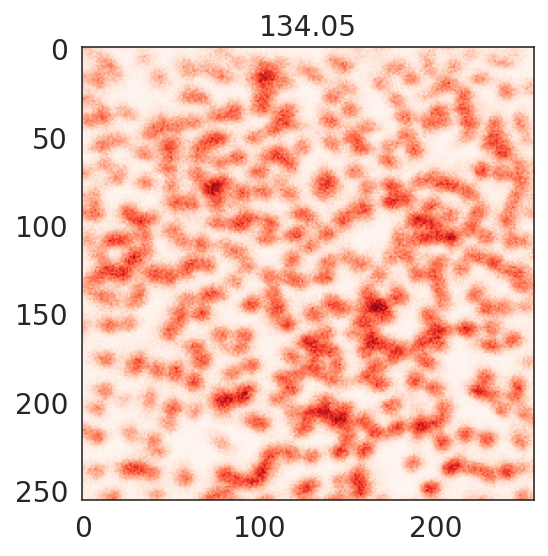

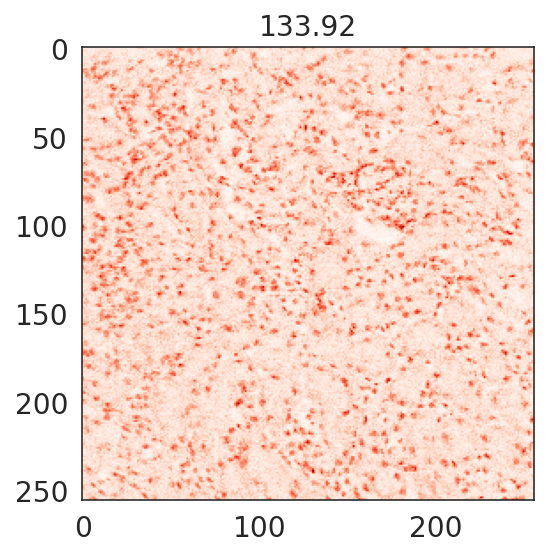

...

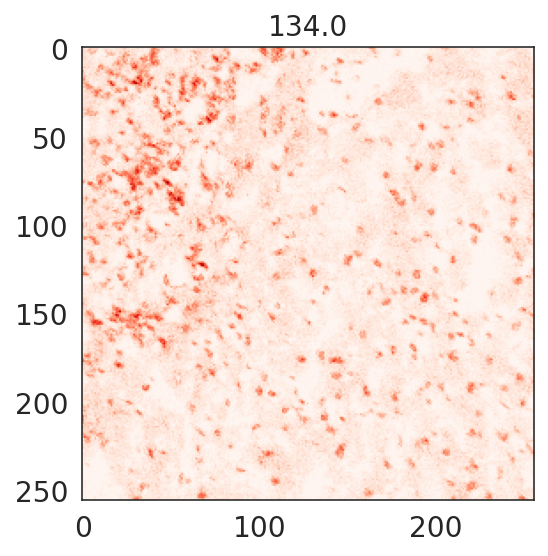

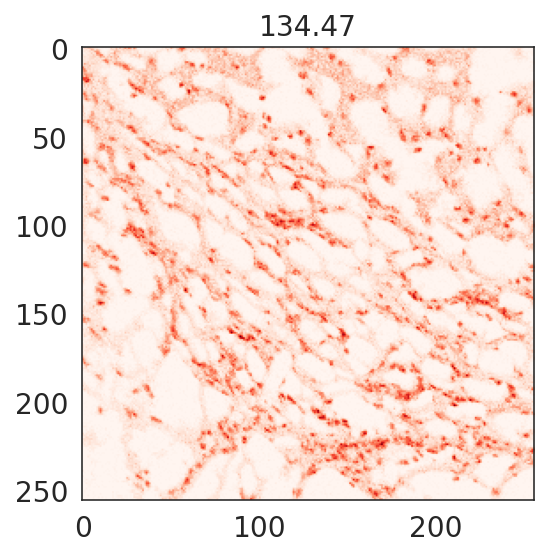

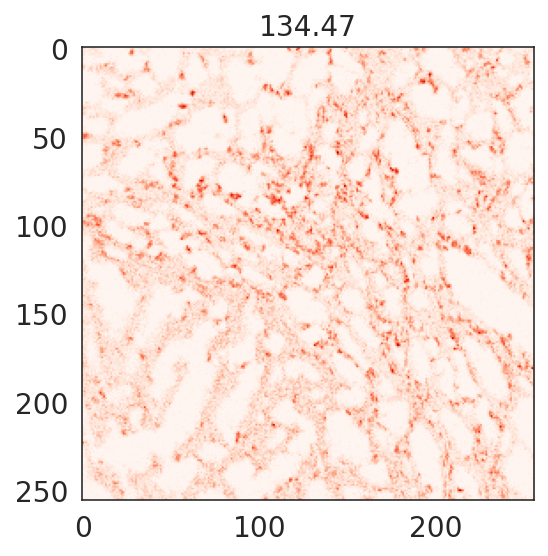

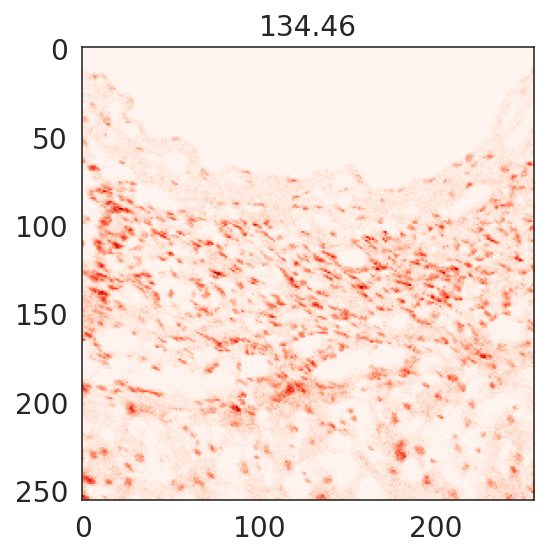

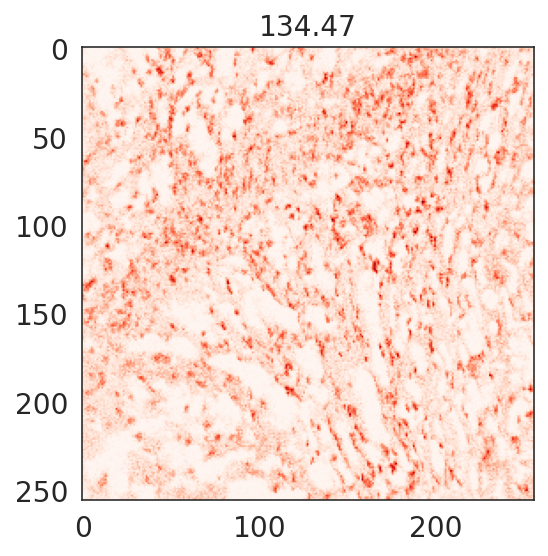

In [6]:
pd_dict = {}
df = pd.DataFrame(pd_dict)
for i in range(len(file_list)):
    cur_file = file_list[i]
    cur_n_matter = n_matter_list[i]
    test_sample,matters_candidate = get_SIMS_data(cur_file,cur_n_matter)
    cur_A = get_closest_A(matters_candidate)
    show_mz(cur_A,test_sample,matters_candidate)
    data_134 = test_sample[:,matters_candidate==cur_A][:,0]
    batch_name = name_list[i]
    

    cor_array = np.zeros(shape=(len(matters_candidate,)))
    for i in range(len(matters_candidate)):
        [a,b] = pearsonr(data_134,test_sample[:,i])
        cor_array[i] = a
    sorted_idx = np.flip(np.argsort(cor_array),axis=0)
    sorted_cors = np.flip(np.sort(cor_array),axis=0)
    matters_candidate_np = np.array(matters_candidate)
#     print(matters_candidate_np[sorted_idx[:20]])
#     print(sorted_cors[:20])
    sorted_matters = matters_candidate_np[sorted_idx[:25]]
    sorted_corrs = sorted_cors
    df[batch_name+'_matter'] = pd.Series(sorted_matters)
    df[batch_name+'_corr'] = pd.Series(sorted_corrs)

In [7]:
df

,10A_matter,10A_corr,A549_matter,A549_corr,Hela_matter,Hela_corr,SK_matter,SK_corr,mouse_kidney_matter,mouse_kidney_corr,...,human_R6_matter,human_R6_corr,human_R7_matter,human_R7_corr,human_R8_matter,human_R8_corr,human_R9_matter,human_R9_corr,human_R10_matter,human_R10_corr
0,134.05,1.000000,134.05,1.000000,134.05,1.000000,134.05,1.000000,133.92,1.000000,...,134.00,1.000000,134.47,1.000000,134.47,1.000000,134.46,1.000000,134.47,1.000000
1,127.95,0.911386,127.95,0.911940,127.95,0.959484,127.95,0.929144,180.74,0.795037,...,127.93,0.869735,128.39,0.902371,128.39,0.807676,128.38,0.912375,128.38,0.831162
2,143.95,0.907149,143.95,0.907181,143.95,0.952862,143.95,0.919668,127.84,0.763996,...,180.86,0.858601,181.42,0.886422,181.42,0.805636,181.41,0.898098,181.41,0.824830
3,111.96,0.889596,111.96,0.887124,111.96,0.945908,90.01,0.908175,62.91,0.747758,...,89.99,0.832196,90.36,0.871845,63.26,0.776706,144.41,0.884767,63.26,0.795328
4,106.99,0.874062,106.99,0.884924,106.99,0.945262,111.96,0.906565,89.93,0.740300,...,143.93,0.824840,144.41,0.871761,79.28,0.763468,90.35,0.881924,144.41,0.775247
5,117.02,0.862643,90.01,0.862539,90.01,0.940798,106.99,0.894598,65.95,0.724799,...,105.98,0.779103,106.39,0.842628,90.36,0.755168,106.39,0.849895,90.35,0.771228
6,92.02,0.856156,117.02,0.856114,117.02,0.923770,117.02,0.893381,64.95,0.675167,...,164.90,0.772325,165.42,0.841900,144.41,0.751311,165.42,0.848269,79.28,0.770738
7,90.01,0.840651,92.02,0.846514,92.02,0.922459,92.02,0.893079,143.82,0.666315,...,111.97,0.757838,63.26,0.838411,165.42,0.721840,63.26,0.843228,165.41,0.750976
8,111.03,0.835234,125.04,0.814807,111.02,0.909041,111.02,0.882904,78.88,0.645382,...,62.95,0.757298,112.39,0.823525,106.39,0.708776,112.38,0.834806,106.38,0.723419
9,106.03,0.829662,106.03,0.814260,106.03,0.903136,106.03,0.875579,102.88,0.644209,...,65.00,0.751040,149.45,0.822627,159.42,0.700704,149.44,0.832391,112.38,0.714912


In [8]:
# pd_dict={'10A_matter':matters_candidate_np[sorted_idx[:20]],
#         '10A_corr':sorted_cors[:20]}

# df = pd.DataFrame(pd_dict)
writer = pd.ExcelWriter('/home/yzy/ipynbs/figures/Supp/top25_corr.xlsx')
df.to_excel(writer)
writer.save()

In [ ]:


cor_array = np.zeros(shape=(len(matters_candidate,)))
for i in range(len(matters_candidate)):
    [a,b] = pearsonr(data_134,train_x[:,i])
    cor_array[i] = a
sorted_idx = np.flip(np.argsort(cor_array),axis=0)
sorted_cors = np.flip(np.sort(cor_array),axis=0)
matters_candidate_np = np.array(matters_candidate)
print(matters_candidate_np[sorted_idx[:20]])
print(sorted_cors[:20])
sorted_matters = matters_candidate_np[sorted_idx[:20]]
sorted_corrs = sorted_cors
df[batch_name+'_matter'] = pd.Series(sorted_matters)
df[batch_name+'_corr'] = pd.Series(sorted_corrs)